<a href="https://colab.research.google.com/github/bimarshak7/GAN-image-restore/blob/main/Old_photo_Restoration_PatchGAN(Tanh).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#snippet to mount drive and copy kaggle API keys
# place you kaggle keys at MyDrive/Colab Notebooks/ as kaggle.json
from google.colab import drive
drive.mount('/content/drive')
! mkdir ~/.kaggle
!cp "/content/drive/MyDrive/Colab Notebooks/kaggle.json" ~/.kaggle/kaggle.json
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
# download clean image data from kaggle
!kaggle datasets download -d tommykamaz/faces-dataset-small
!unzip -q *.zip

In [ ]:
# we will use gdown to downlad correson noisy image data from drive
import gdown

In [ ]:
# https://drive.google.com/file/d/1nTt-dP2CKgh3XO-uPBOQwFoPUzA27hPj/view?usp=sharing
url = "https://drive.google.com/uc?id=1nTt-dP2CKgh3XO-uPBOQwFoPUzA27hPj"
output = "data.zip"
gdown.download(url, output, quiet=True)

'data.zip'

In [ ]:
!mkdir dataset # this is where we will arraange our dataset

!unzip -q data.zip #extract  zip containing noisy image
!mv "content/drive/MyDrive/Colab Notebooks/noisy" dataset/ #oops! folder structure inside zip is little messy, noisy images will be at dataset/noisy
!rm -r content # remove empty dir

# clean images will be at dataset/clean
!mkdir dataset/clean
!cp /content/faces_dataset_small/* dataset/clean



In [ ]:
print("~ Dataset folder managed.")

~ Dataset folder managed.


In [ ]:
#import necessary libraries

import os
import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader
from torchvision.io import read_image
from torchvision import transforms
import torch.optim as optim
import torch.nn.functional as F

from matplotlib import pyplot as plt
from PIL import Image

In [ ]:
# data preprocessing using pytorch transofrms
# we will feed image of dimensions 256x256 to our models

transform = transforms.Compose([
   transforms.ToPILImage(),
    transforms.Resize((256,256),antialias=True),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5], std=[0.5]),
])

In [ ]:
class ImageDataset(Dataset):
  """Custon Pytorch Dataset Object to create dataset that yields pair of images from clean and noisy folder."""

  def __init__(self,dir,transform=None):
    self.img_dir = dir
    self.transform = transform
    self.images = os.listdir(self.img_dir+"clean")


  def __len__(self):
    return len(self.images)

  def __getitem__(self, idx):
    img_path_org = os.path.join(self.img_dir+"clean",self.images[idx])
    img_path_filt = os.path.join(self.img_dir+"noisy",self.images[idx])

    image_raw = read_image(img_path_org)
    image_filt = read_image(img_path_filt)

    image_raw =  self.transform(image_raw)
    image_filt = self.transform(image_filt)

    if image_raw.shape[0]==1:
        image_raw = torch.cat([image_raw,image_raw,image_raw])
    return (image_raw,image_filt)

  def see_random(self,n):
    """
      Vizualize random images from custom dataset
      n: number of rows to show
      c: nubmer of columns per row
    """

    figure = plt.figure(figsize=(8, 8))
    idxs = torch.randint(1,len(self.images),(n*2,))
    for i in range(1,len(idxs)+1,2):
      # print("Path",os.path.join(self.img_dir,self.images[idxs[i-1]]))
      img_raw = os.path.join(self.img_dir+"clean",self.images[idxs[i-1]])
      img_filt = os.path.join(self.img_dir+"noisy",self.images[idxs[i-1]])

      image_raw = read_image(img_raw)
      image_filt = read_image(img_filt)

      image_raw = self.transform(image_raw)
      image_filt = self.transform(image_filt)
      figure.add_subplot(n, 2, i)
      if image_raw.shape[0]==1:
        image_raw = torch.cat([image_raw,image_raw,image_raw])
      plt.imshow(image_raw.squeeze().permute(1,2,0))
      plt.title("Original Image")

      figure.add_subplot(n, 2, i+1)
      plt.imshow(image_filt.permute(1,2,0))
      plt.title("Processed Image")

    plt.show()

In [ ]:
#define path for dataset
path = "dataset/"

In [ ]:
# create a new dataset instance
dataset = ImageDataset(path,transform)

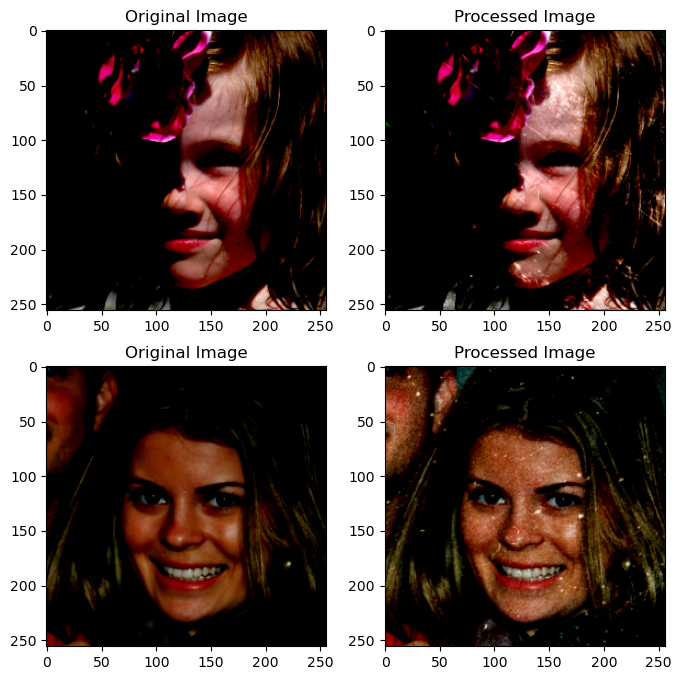

In [ ]:
# use see_random method to view dataset samples
dataset.see_random(2)

In [ ]:
#split dataset into train and test split
train_dataset, val_dataset = torch.utils.data.random_split(dataset, [0.9, 0.1])

In [ ]:
# define batch size
BATCH_SIZE = 32

In [ ]:
# create Dataloader object for train and test from splitted dataset
train_loader =  DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader =  DataLoader(val_dataset, batch_size=BATCH_SIZE)

In [ ]:
print("~ Dataset Object and dataset loader created.")

~ Dataset Object and dataset loader created.


In [ ]:
class DownSampleConv(nn.Module):

    def __init__(self, in_channels, out_channels, kernel=4, strides=2, padding=1, activation=True, batchnorm=True):
        """
        - All convolutions are 4×4 spatial filters applied with stride 2
        - Convolutions in the encoder downsample by a factor of 2
        """
        super().__init__()
        self.activation = activation
        self.batchnorm = batchnorm

        self.conv = nn.Conv2d(in_channels, out_channels, kernel, strides, padding)

        if batchnorm:
            self.bn = nn.BatchNorm2d(out_channels)

        if activation:
            self.act = nn.LeakyReLU(0.2)

    def forward(self, x):
        x = self.conv(x)
        if self.batchnorm:
            x = self.bn(x)
        if self.activation:
            x = self.act(x)
        return x

In [ ]:
class UpSampleConv(nn.Module):

    def __init__(
        self,
        in_channels,
        out_channels,
        kernel=4,
        strides=2,
        padding=1,
        activation=True,
        batchnorm=True,
        dropout=False
    ):
        super().__init__()
        self.activation = activation
        self.batchnorm = batchnorm
        self.dropout = dropout

        self.deconv = nn.ConvTranspose2d(in_channels, out_channels, kernel, strides, padding)

        if batchnorm:
            self.bn = nn.BatchNorm2d(out_channels)

        if activation:
            self.act = nn.ReLU(True)

        if dropout:
            self.drop = nn.Dropout2d(0.5)

    def forward(self, x):
        x = self.deconv(x)
        if self.batchnorm:
            x = self.bn(x)

        if self.dropout:
            x = self.drop(x)
        return x

In [ ]:
class Generator(nn.Module):

    def __init__(self, in_channels, out_channels):
        """
        Paper details:
        - Encoder: C64-C128-C256-C512-C512-C512-C512-C512
        - All convolutions are 4×4 spatial filters applied with stride 2
        - Convolutions in the encoder downsample by a factor of 2
        - Decoder: CD512-CD1024-CD1024-C1024-C1024-C512 -C256-C128
        """
        super().__init__()

        # encoder/donwsample convs
        self.encoders = [
            DownSampleConv(in_channels, 64, batchnorm=False),  # bs x 64 x 128 x 128
            DownSampleConv(64, 128),  # bs x 128 x 64 x 64
            DownSampleConv(128, 256),  # bs x 256 x 32 x 32
            DownSampleConv(256, 512),  # bs x 512 x 16 x 16
            DownSampleConv(512, 512),  # bs x 512 x 8 x 8
            DownSampleConv(512, 512),  # bs x 512 x 4 x 4
            DownSampleConv(512, 512),  # bs x 512 x 2 x 2
            DownSampleConv(512, 512, batchnorm=False),  # bs x 512 x 1 x 1
        ]

        # decoder/upsample convs
        self.decoders = [
            UpSampleConv(512, 512, dropout=True),  # bs x 512 x 2 x 2
            UpSampleConv(1024, 512, dropout=True),  # bs x 512 x 4 x 4
            UpSampleConv(1024, 512, dropout=True),  # bs x 512 x 8 x 8
            UpSampleConv(1024, 512),  # bs x 512 x 16 x 16
            UpSampleConv(1024, 256),  # bs x 256 x 32 x 32
            UpSampleConv(512, 128),  # bs x 128 x 64 x 64
            UpSampleConv(256, 64),  # bs x 64 x 128 x 128
        ]
        self.decoder_channels = [512, 512, 512, 512, 256, 128, 64]
        self.final_conv = nn.ConvTranspose2d(64, out_channels, kernel_size=4, stride=2, padding=1)
        self.tanh = nn.Tanh()

        self.encoders = nn.ModuleList(self.encoders)
        self.decoders = nn.ModuleList(self.decoders)

    def forward(self, x):
        skips_cons = []
        # maintain output of encoder layers to later used as skip connections with decoder
        for encoder in self.encoders:
            x = encoder(x)

            skips_cons.append(x)

        skips_cons = list(reversed(skips_cons[:-1]))
        decoders = self.decoders[:-1]

        # concat output of skip layers
        for decoder, skip in zip(decoders, skips_cons):
            x = decoder(x)
            x = torch.cat((x, skip), axis=1)

        # last layer of decoder
        x = self.decoders[-1](x)
        x = self.final_conv(x)
        return self.tanh(x)

We will use PatchGan discriminator. It will take image to discriminate(output of generator or real image) along with input image(noisy image) as input. This will help to make decision for discriminator with pixel level observation.

In [ ]:
class PatchGAN(nn.Module):

    def __init__(self, input_channels):
        super().__init__()
        self.d1 = DownSampleConv(input_channels, 64, batchnorm=False)
        self.d2 = DownSampleConv(64, 128)
        self.d3 = DownSampleConv(128, 256)
        self.d4 = DownSampleConv(256, 512)
        self.final = nn.Conv2d(512, 1, kernel_size=1)

    def forward(self, x, y):
        x = torch.cat([x, y], axis=1)
        x0 = self.d1(x)
        x1 = self.d2(x0)
        x2 = self.d3(x1)
        x3 = self.d4(x2)
        xn = self.final(x3)
        return xn

In [ ]:
def PSNR(original, predicted):
    """Takes batch of original and predicted image and calculate PSNR values between them"""
    vals = []
    for org,pred in zip(original,predicted):
      mse = torch.mean((org - pred) ** 2)
      if(mse == 0):  # MSE is zero means no noise is present in the signal .
                  # Therefore PSNR have no importance.
          return 100
      max_pixel = 1.0
      psnr = 20 * torch.log10(max_pixel / torch.sqrt(mse))
      vals.append(psnr)
    return psnr

In [ ]:
def display_progress(cond, fake, real, figsize=(10,5)):
  """Function to display results while the image is being trained"""

    cond = cond.detach().cpu().permute(1, 2, 0)
    fake = fake.detach().cpu().permute(1, 2, 0)
    real = real.detach().cpu().permute(1, 2, 0)

    fig, ax = plt.subplots(1, 3, figsize=figsize)
    ax[0].imshow(cond)
    ax[0].set_title("Input Image")
    ax[2].imshow(fake)
    ax[1].set_title("Ground Truth")
    ax[2].set_title("Predicted Image")
    ax[1].imshow(real)
    plt.show()

In [ ]:
print("~ Models Defined. \n Starting training...")

~ Models Defined. 
 Starting training...


In [ ]:
from tqdm import tqdm

Epoch [1/40], Step [80/89], Discriminator Loss: 0.6195, Generator Loss: 0.6368, PSNR: --:  89%|████████▉ | 79/89 [04:44<00:35,  3.51s/it]

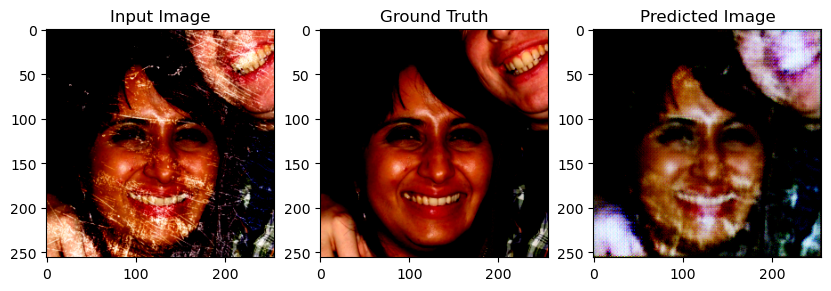

Epoch [1/40], Step [89/89], Discriminator Loss: 0.5783, Generator Loss: 0.5948, PSNR: --: 100%|██████████| 89/89 [05:15<00:00,  3.55s/it]
Epoch [2/40], Step [80/89], Discriminator Loss: 0.3433, Generator Loss: 0.3329, PSNR: 2.649155616760254:  89%|████████▉ | 79/89 [04:35<00:35,  3.51s/it]

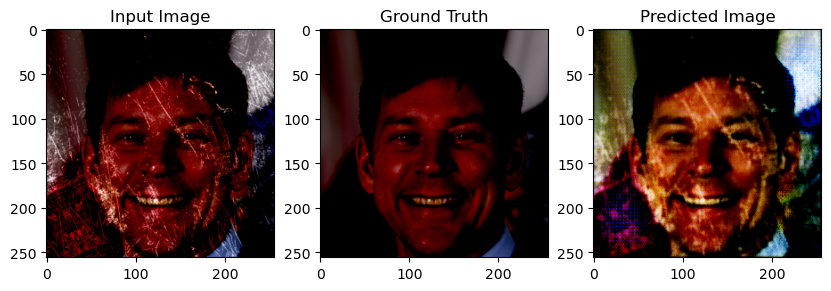

Epoch [2/40], Step [89/89], Discriminator Loss: 0.3200, Generator Loss: 0.2966, PSNR: 2.649155616760254: 100%|██████████| 89/89 [05:04<00:00,  3.42s/it]
Epoch [3/40], Step [80/89], Discriminator Loss: 0.1576, Generator Loss: 0.1540, PSNR: 2.4148740768432617:  89%|████████▉ | 79/89 [04:30<00:34,  3.43s/it]

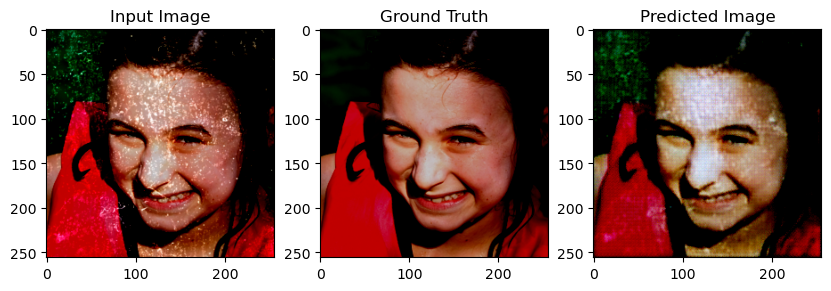

Epoch [3/40], Step [89/89], Discriminator Loss: 0.2155, Generator Loss: 0.2056, PSNR: 2.4148740768432617: 100%|██████████| 89/89 [05:00<00:00,  3.37s/it]
Epoch [4/40], Step [80/89], Discriminator Loss: 0.0861, Generator Loss: 0.0737, PSNR: 6.691446304321289:  89%|████████▉ | 79/89 [04:32<00:33,  3.36s/it]

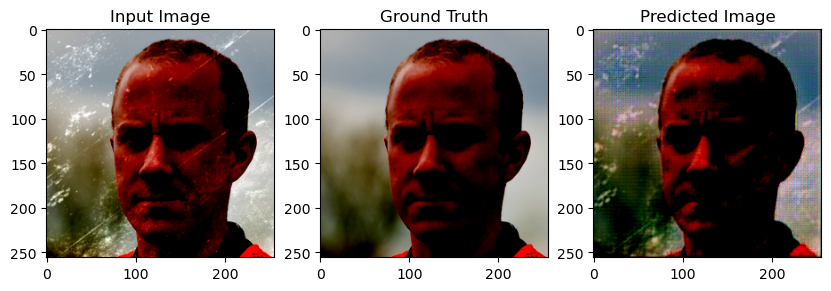

Epoch [4/40], Step [89/89], Discriminator Loss: 0.1190, Generator Loss: 0.0677, PSNR: 6.691446304321289: 100%|██████████| 89/89 [05:01<00:00,  3.39s/it]
Epoch [5/40], Step [80/89], Discriminator Loss: 0.0635, Generator Loss: 0.0549, PSNR: 3.637188673019409:  89%|████████▉ | 79/89 [04:28<00:33,  3.33s/it]

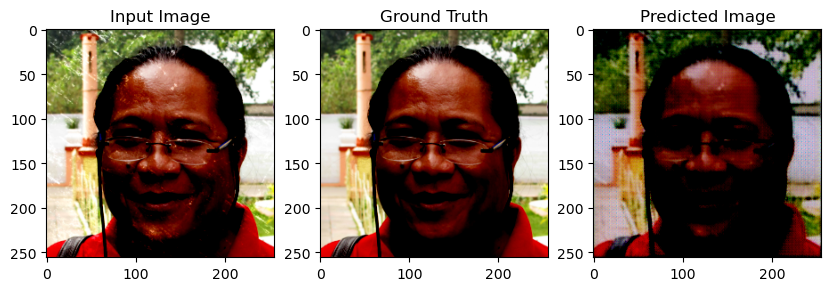

Epoch [5/40], Step [89/89], Discriminator Loss: 0.1158, Generator Loss: 0.0640, PSNR: 3.637188673019409: 100%|██████████| 89/89 [04:56<00:00,  3.34s/it]
Epoch [6/40], Step [80/89], Discriminator Loss: 0.0322, Generator Loss: 0.0357, PSNR: 5.49058198928833:  89%|████████▉ | 79/89 [04:29<00:34,  3.48s/it]

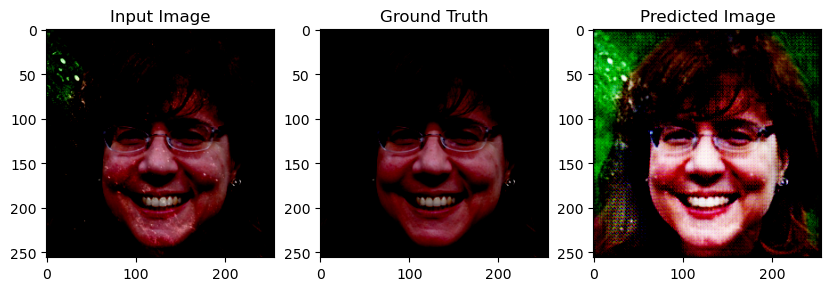

Epoch [6/40], Step [89/89], Discriminator Loss: 0.0389, Generator Loss: 0.0426, PSNR: 5.49058198928833: 100%|██████████| 89/89 [04:59<00:00,  3.36s/it]
Epoch [7/40], Step [80/89], Discriminator Loss: 0.0316, Generator Loss: 0.0225, PSNR: 3.9613568782806396:  89%|████████▉ | 79/89 [04:30<00:34,  3.41s/it]

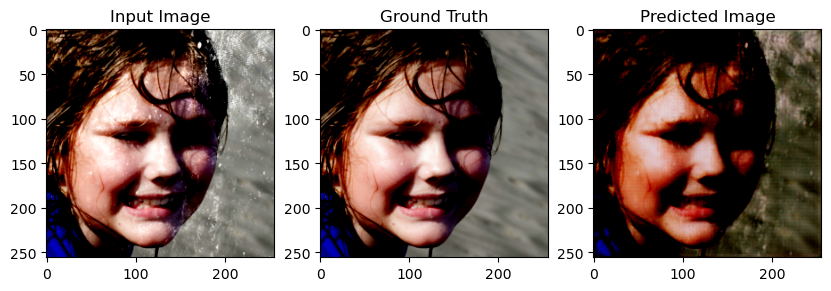

Epoch [7/40], Step [89/89], Discriminator Loss: 0.0248, Generator Loss: 0.0214, PSNR: 3.9613568782806396: 100%|██████████| 89/89 [04:59<00:00,  3.37s/it]
Epoch [8/40], Step [80/89], Discriminator Loss: 0.0527, Generator Loss: 0.0493, PSNR: 4.886020183563232:  89%|████████▉ | 79/89 [04:29<00:33,  3.33s/it]

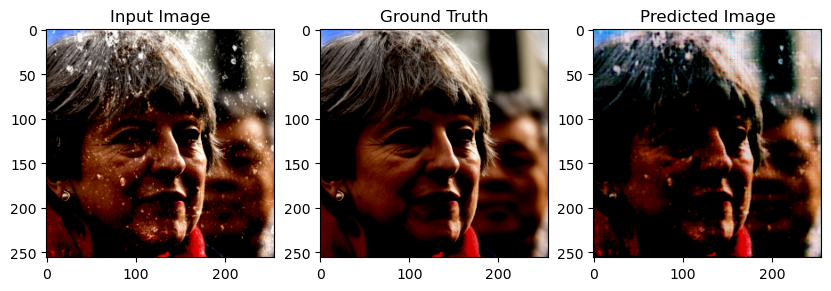

Epoch [8/40], Step [89/89], Discriminator Loss: 0.0658, Generator Loss: 0.0812, PSNR: 4.886020183563232: 100%|██████████| 89/89 [04:59<00:00,  3.36s/it]
Epoch [9/40], Step [80/89], Discriminator Loss: 0.0569, Generator Loss: 0.0765, PSNR: 5.403263568878174:  89%|████████▉ | 79/89 [04:29<00:33,  3.40s/it]

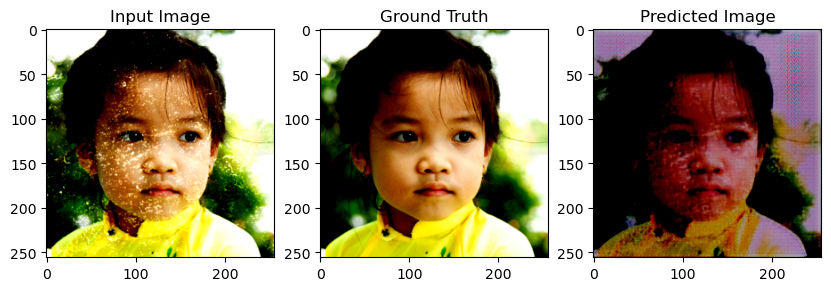

Epoch [9/40], Step [89/89], Discriminator Loss: 0.0196, Generator Loss: 0.0188, PSNR: 5.403263568878174: 100%|██████████| 89/89 [04:58<00:00,  3.36s/it]
Epoch [10/40], Step [80/89], Discriminator Loss: 0.0135, Generator Loss: 0.0175, PSNR: 3.3875293731689453:  89%|████████▉ | 79/89 [04:29<00:35,  3.55s/it]

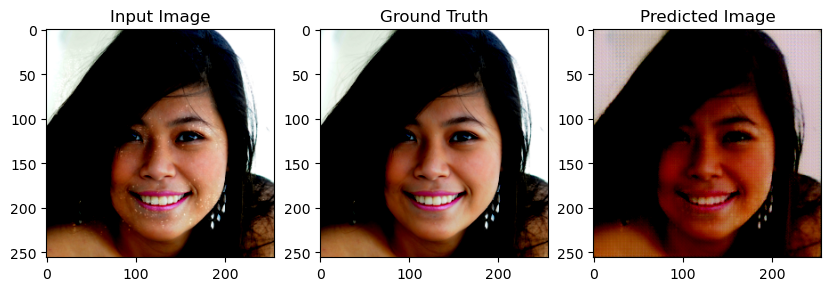

Epoch [10/40], Step [89/89], Discriminator Loss: 0.0544, Generator Loss: 0.0827, PSNR: 3.3875293731689453: 100%|██████████| 89/89 [04:58<00:00,  3.35s/it]
Epoch [11/40], Step [80/89], Discriminator Loss: 0.0137, Generator Loss: 0.0104, PSNR: 1.0387868881225586:  89%|████████▉ | 79/89 [04:30<00:34,  3.45s/it]

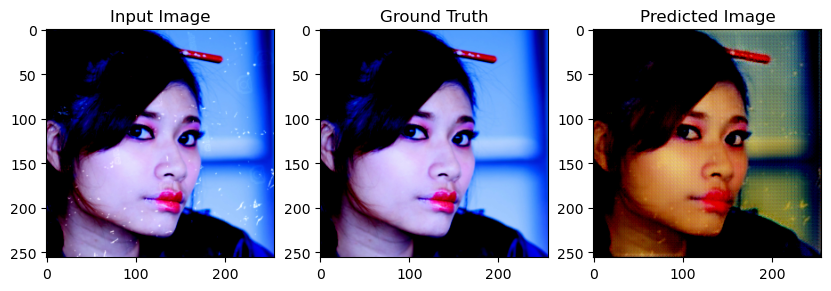

Epoch [11/40], Step [89/89], Discriminator Loss: 0.0383, Generator Loss: 0.0341, PSNR: 1.0387868881225586: 100%|██████████| 89/89 [04:59<00:00,  3.37s/it]
Epoch [12/40], Step [80/89], Discriminator Loss: 0.0254, Generator Loss: 0.0300, PSNR: 5.015200614929199:  89%|████████▉ | 79/89 [04:30<00:33,  3.38s/it]

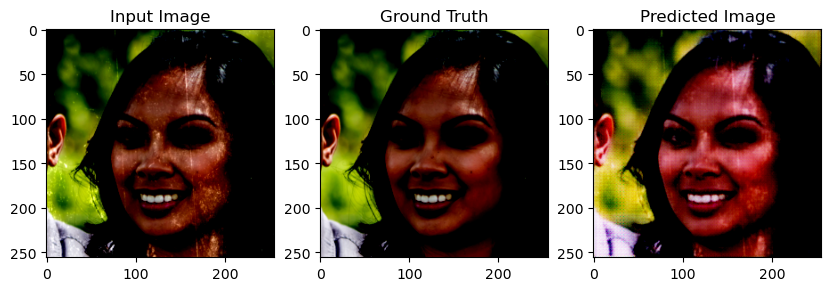

Epoch [12/40], Step [89/89], Discriminator Loss: 0.0175, Generator Loss: 0.0166, PSNR: 5.015200614929199: 100%|██████████| 89/89 [04:59<00:00,  3.37s/it]
Epoch [13/40], Step [80/89], Discriminator Loss: 0.0131, Generator Loss: 0.0131, PSNR: 3.367520570755005:  89%|████████▉ | 79/89 [04:28<00:33,  3.40s/it]

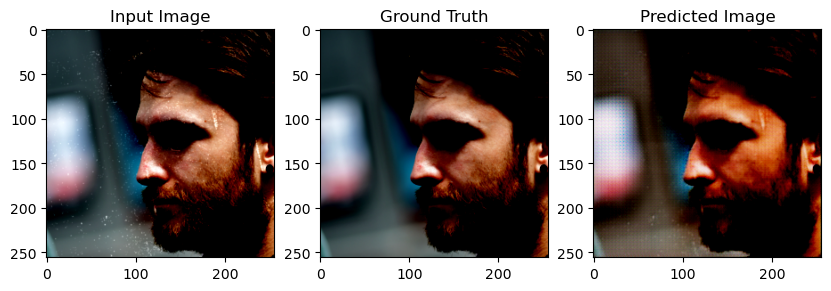

Epoch [13/40], Step [89/89], Discriminator Loss: 0.0257, Generator Loss: 0.0188, PSNR: 3.367520570755005: 100%|██████████| 89/89 [04:58<00:00,  3.35s/it]
Epoch [14/40], Step [80/89], Discriminator Loss: 0.0174, Generator Loss: 0.0198, PSNR: 5.507803440093994:  89%|████████▉ | 79/89 [04:29<00:33,  3.35s/it]

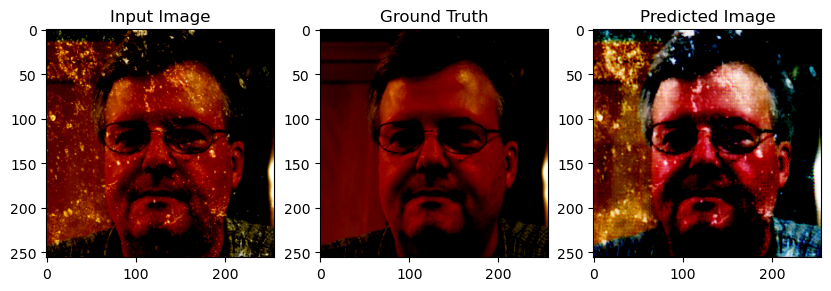

Epoch [14/40], Step [89/89], Discriminator Loss: 0.0169, Generator Loss: 0.0182, PSNR: 5.507803440093994: 100%|██████████| 89/89 [04:58<00:00,  3.35s/it]
Epoch [15/40], Step [80/89], Discriminator Loss: 0.0136, Generator Loss: 0.0089, PSNR: 3.4086413383483887:  89%|████████▉ | 79/89 [04:28<00:33,  3.40s/it]

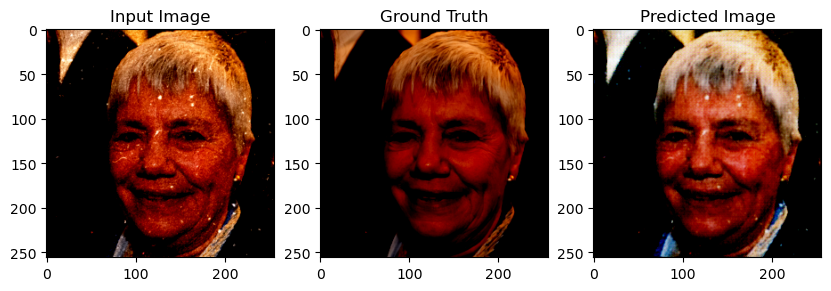

Epoch [15/40], Step [89/89], Discriminator Loss: 0.0159, Generator Loss: 0.0213, PSNR: 3.4086413383483887: 100%|██████████| 89/89 [04:57<00:00,  3.34s/it]
Epoch [16/40], Step [80/89], Discriminator Loss: 0.0232, Generator Loss: 0.0240, PSNR: 4.162631988525391:  89%|████████▉ | 79/89 [04:28<00:34,  3.42s/it]

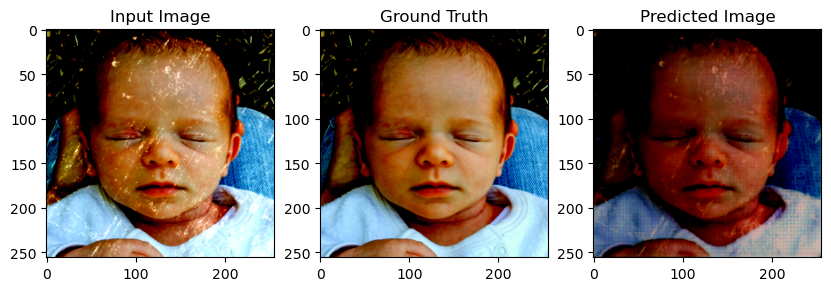

Epoch [16/40], Step [89/89], Discriminator Loss: 0.0345, Generator Loss: 0.0137, PSNR: 4.162631988525391: 100%|██████████| 89/89 [04:57<00:00,  3.34s/it]
Epoch [17/40], Step [80/89], Discriminator Loss: 0.0033, Generator Loss: 0.0040, PSNR: 4.760368347167969:  89%|████████▉ | 79/89 [04:27<00:33,  3.34s/it]

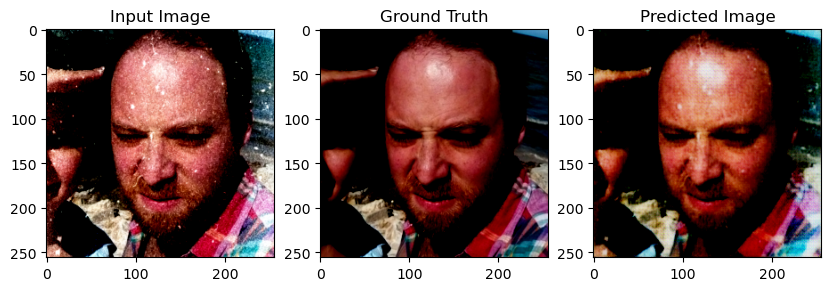

Epoch [17/40], Step [89/89], Discriminator Loss: 0.0050, Generator Loss: 0.0046, PSNR: 4.760368347167969: 100%|██████████| 89/89 [04:56<00:00,  3.33s/it]
Epoch [18/40], Step [80/89], Discriminator Loss: 0.0061, Generator Loss: 0.0060, PSNR: 4.234994888305664:  89%|████████▉ | 79/89 [04:28<00:33,  3.39s/it]

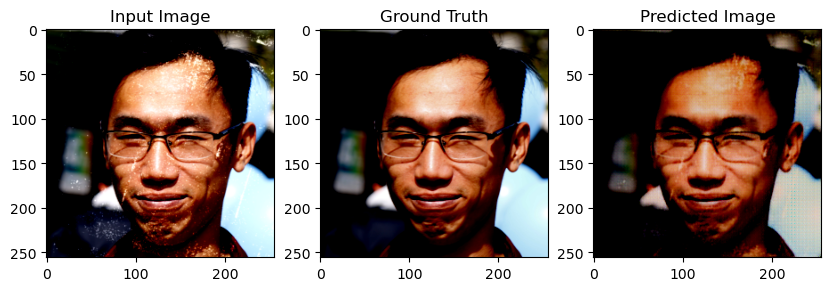

Epoch [18/40], Step [89/89], Discriminator Loss: 0.0052, Generator Loss: 0.0065, PSNR: 4.234994888305664: 100%|██████████| 89/89 [04:57<00:00,  3.34s/it]
Epoch [19/40], Step [80/89], Discriminator Loss: 0.0023, Generator Loss: 0.0025, PSNR: 5.391355514526367:  89%|████████▉ | 79/89 [04:29<00:33,  3.36s/it]

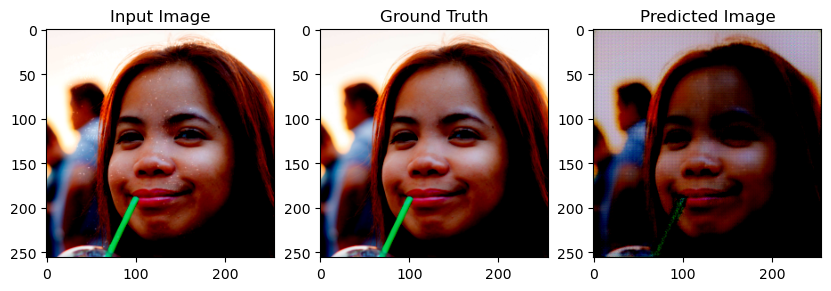

Epoch [19/40], Step [89/89], Discriminator Loss: 0.0099, Generator Loss: 0.0140, PSNR: 5.391355514526367: 100%|██████████| 89/89 [04:58<00:00,  3.35s/it]
Epoch [20/40], Step [80/89], Discriminator Loss: 0.0904, Generator Loss: 0.0693, PSNR: 2.989377021789551:  89%|████████▉ | 79/89 [04:30<00:35,  3.50s/it]

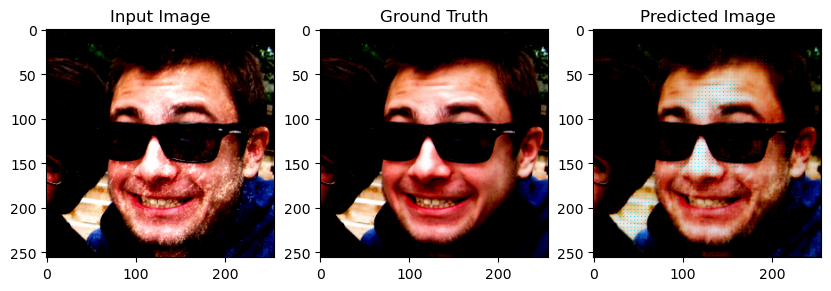

Epoch [20/40], Step [89/89], Discriminator Loss: 0.1229, Generator Loss: 0.1060, PSNR: 2.989377021789551: 100%|██████████| 89/89 [04:59<00:00,  3.37s/it]
Epoch [21/40], Step [80/89], Discriminator Loss: 0.0466, Generator Loss: 0.0395, PSNR: 5.8002543449401855:  89%|████████▉ | 79/89 [04:29<00:33,  3.36s/it]

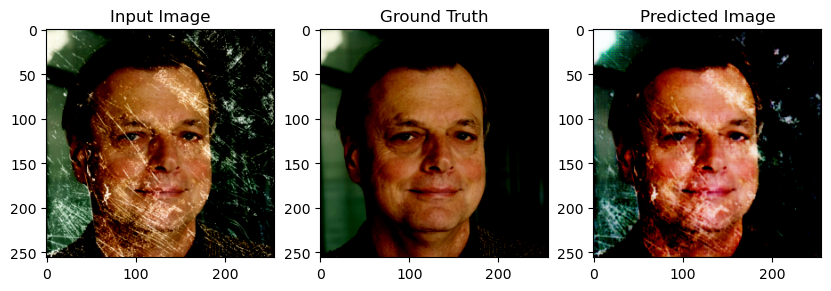

Epoch [21/40], Step [89/89], Discriminator Loss: 0.0156, Generator Loss: 0.0134, PSNR: 5.8002543449401855: 100%|██████████| 89/89 [04:58<00:00,  3.36s/it]
Epoch [22/40], Step [80/89], Discriminator Loss: 0.0118, Generator Loss: 0.0109, PSNR: 4.606004238128662:  89%|████████▉ | 79/89 [04:29<00:33,  3.36s/it]

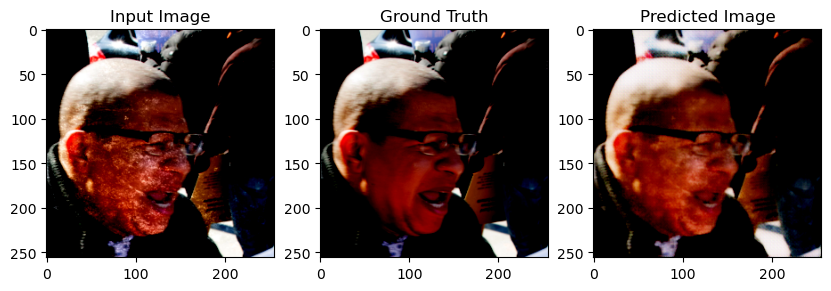

Epoch [22/40], Step [89/89], Discriminator Loss: 0.0110, Generator Loss: 0.0137, PSNR: 4.606004238128662: 100%|██████████| 89/89 [04:58<00:00,  3.35s/it]
Epoch [23/40], Step [80/89], Discriminator Loss: 0.0042, Generator Loss: 0.0041, PSNR: 4.7670745849609375:  89%|████████▉ | 79/89 [04:29<00:33,  3.35s/it]

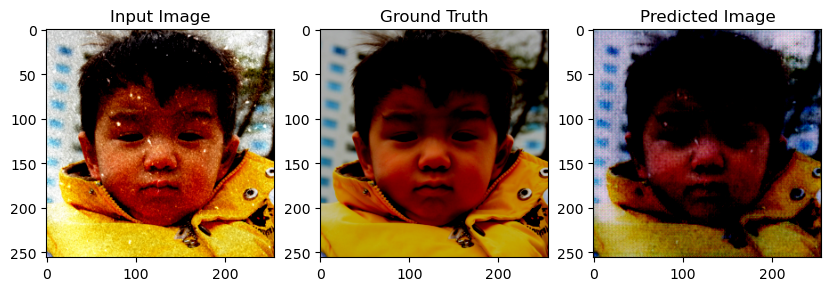

Epoch [23/40], Step [89/89], Discriminator Loss: 0.0091, Generator Loss: 0.0051, PSNR: 4.7670745849609375: 100%|██████████| 89/89 [04:58<00:00,  3.36s/it]
Epoch [24/40], Step [80/89], Discriminator Loss: 0.0027, Generator Loss: 0.0027, PSNR: 5.1728925704956055:  89%|████████▉ | 79/89 [04:29<00:33,  3.34s/it]

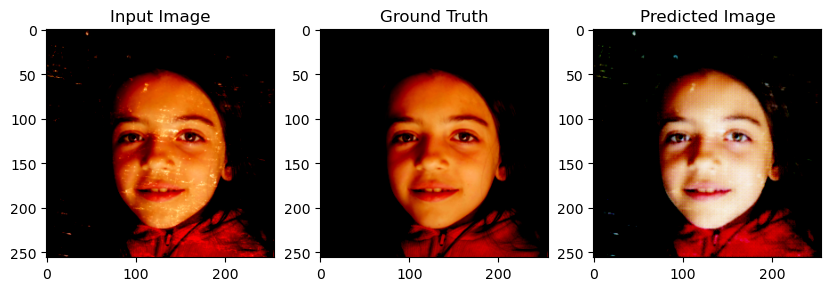

Epoch [24/40], Step [89/89], Discriminator Loss: 0.0240, Generator Loss: 0.0131, PSNR: 5.1728925704956055: 100%|██████████| 89/89 [04:58<00:00,  3.36s/it]
Epoch [25/40], Step [80/89], Discriminator Loss: 0.0036, Generator Loss: 0.0034, PSNR: 4.512962818145752:  89%|████████▉ | 79/89 [04:29<00:34,  3.48s/it]

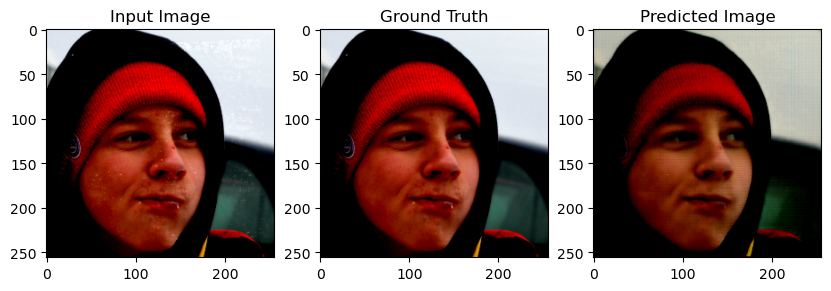

Epoch [25/40], Step [89/89], Discriminator Loss: 0.0023, Generator Loss: 0.0021, PSNR: 4.512962818145752: 100%|██████████| 89/89 [04:59<00:00,  3.36s/it]
Epoch [26/40], Step [80/89], Discriminator Loss: 0.0034, Generator Loss: 0.0028, PSNR: 3.900639533996582:  89%|████████▉ | 79/89 [04:29<00:33,  3.35s/it]

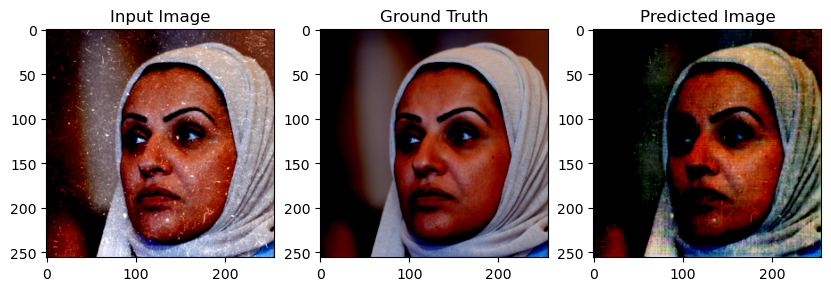

Epoch [26/40], Step [89/89], Discriminator Loss: 0.0097, Generator Loss: 0.0040, PSNR: 3.900639533996582: 100%|██████████| 89/89 [04:59<00:00,  3.36s/it]
Epoch [27/40], Step [80/89], Discriminator Loss: 0.0029, Generator Loss: 0.0027, PSNR: 5.006235122680664:  89%|████████▉ | 79/89 [04:30<00:33,  3.37s/it]

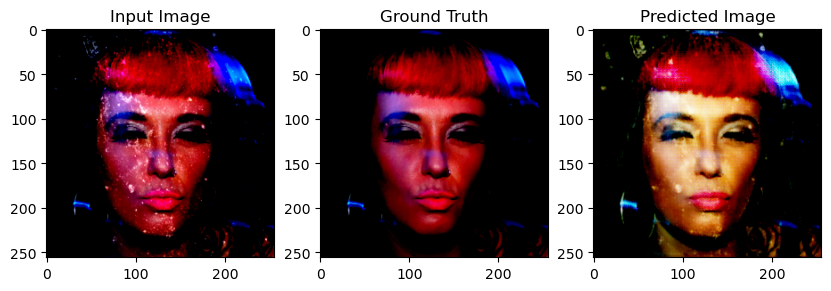

Epoch [27/40], Step [89/89], Discriminator Loss: 0.0968, Generator Loss: 0.0320, PSNR: 5.006235122680664: 100%|██████████| 89/89 [05:00<00:00,  3.38s/it]
Epoch [28/40], Step [80/89], Discriminator Loss: 0.0057, Generator Loss: 0.0061, PSNR: 4.710944175720215:  89%|████████▉ | 79/89 [04:31<00:33,  3.35s/it]

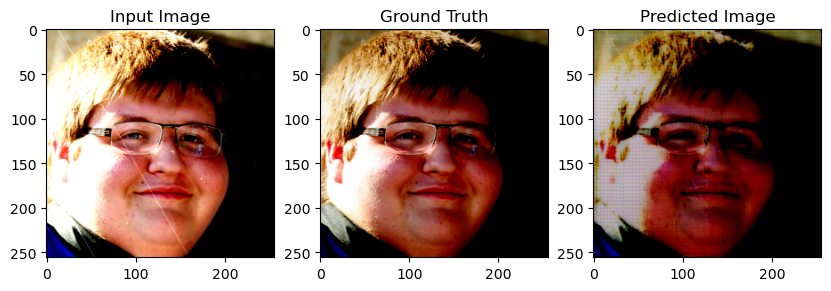

Epoch [28/40], Step [89/89], Discriminator Loss: 0.0066, Generator Loss: 0.0087, PSNR: 4.710944175720215: 100%|██████████| 89/89 [05:01<00:00,  3.38s/it]
Epoch [29/40], Step [80/89], Discriminator Loss: 0.0036, Generator Loss: 0.0037, PSNR: 7.330695152282715:  89%|████████▉ | 79/89 [04:31<00:33,  3.38s/it]

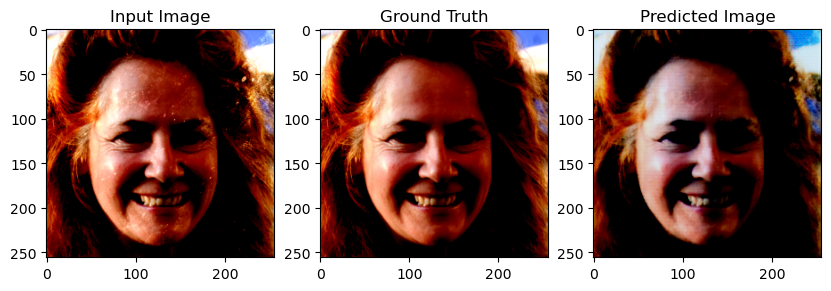

Epoch [29/40], Step [89/89], Discriminator Loss: 0.0036, Generator Loss: 0.0030, PSNR: 7.330695152282715: 100%|██████████| 89/89 [05:00<00:00,  3.38s/it]
Epoch [30/40], Step [80/89], Discriminator Loss: 0.0027, Generator Loss: 0.0026, PSNR: 3.8487160205841064:  89%|████████▉ | 79/89 [04:30<00:33,  3.37s/it]

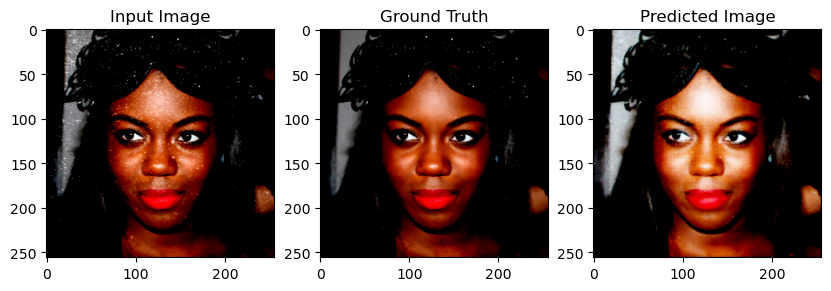

Epoch [30/40], Step [89/89], Discriminator Loss: 0.0027, Generator Loss: 0.0031, PSNR: 3.8487160205841064: 100%|██████████| 89/89 [04:59<00:00,  3.36s/it]
Epoch [31/40], Step [80/89], Discriminator Loss: 0.0038, Generator Loss: 0.0027, PSNR: 6.500096797943115:  89%|████████▉ | 79/89 [04:29<00:33,  3.36s/it]

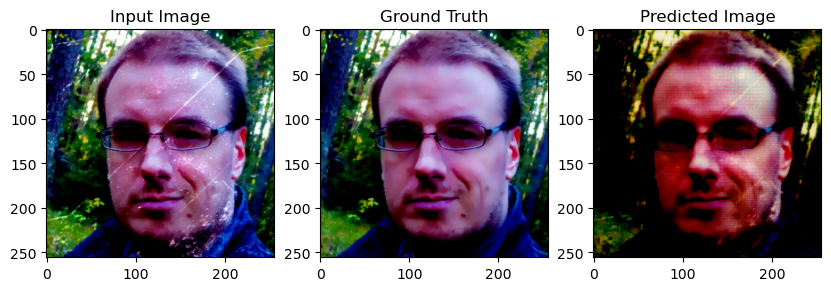

Epoch [31/40], Step [89/89], Discriminator Loss: 0.0044, Generator Loss: 0.0056, PSNR: 6.500096797943115: 100%|██████████| 89/89 [04:58<00:00,  3.36s/it]
Epoch [32/40], Step [80/89], Discriminator Loss: 0.0034, Generator Loss: 0.0045, PSNR: 4.0524163246154785:  89%|████████▉ | 79/89 [04:29<00:32,  3.30s/it]

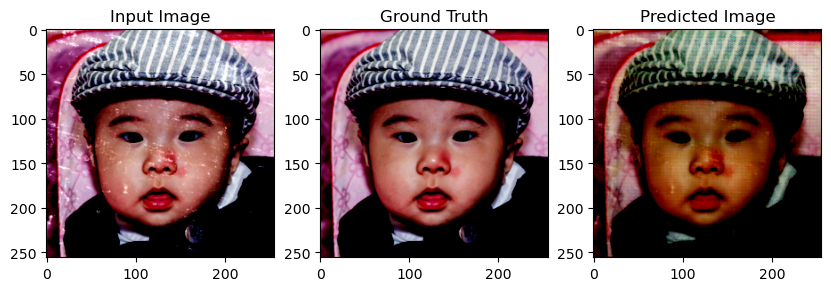

Epoch [32/40], Step [89/89], Discriminator Loss: 0.0062, Generator Loss: 0.0015, PSNR: 4.0524163246154785: 100%|██████████| 89/89 [04:58<00:00,  3.35s/it]
Epoch [33/40], Step [80/89], Discriminator Loss: 0.0017, Generator Loss: 0.0012, PSNR: 4.3756561279296875:  89%|████████▉ | 79/89 [04:31<00:33,  3.38s/it]

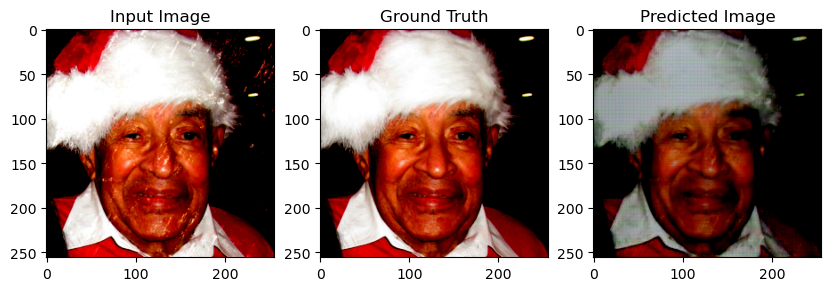

Epoch [33/40], Step [89/89], Discriminator Loss: 0.0073, Generator Loss: 0.0075, PSNR: 4.3756561279296875: 100%|██████████| 89/89 [05:00<00:00,  3.38s/it]
Epoch [34/40], Step [80/89], Discriminator Loss: 0.0026, Generator Loss: 0.0033, PSNR: 7.226081371307373:  89%|████████▉ | 79/89 [04:30<00:33,  3.36s/it]

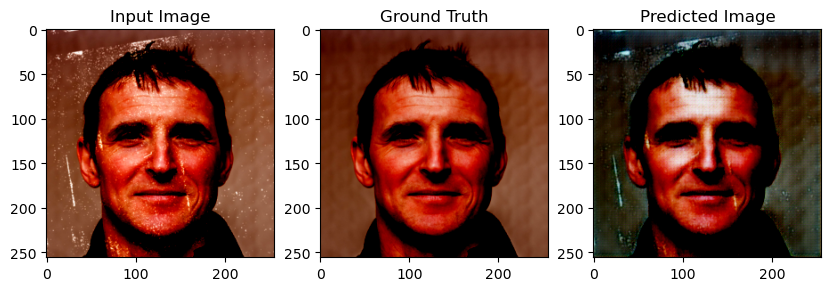

Epoch [34/40], Step [89/89], Discriminator Loss: 0.0073, Generator Loss: 0.0029, PSNR: 7.226081371307373: 100%|██████████| 89/89 [05:00<00:00,  3.37s/it]
Epoch [35/40], Step [80/89], Discriminator Loss: 0.0019, Generator Loss: 0.0024, PSNR: 3.4078550338745117:  89%|████████▉ | 79/89 [04:30<00:33,  3.33s/it]

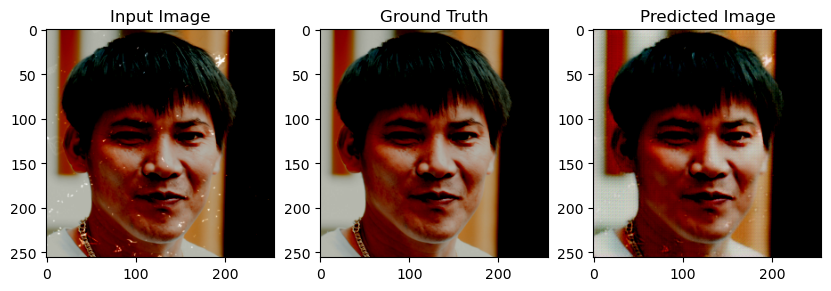

Epoch [35/40], Step [89/89], Discriminator Loss: 0.0034, Generator Loss: 0.0014, PSNR: 3.4078550338745117: 100%|██████████| 89/89 [05:00<00:00,  3.37s/it]
Epoch [36/40], Step [80/89], Discriminator Loss: 0.0017, Generator Loss: 0.0021, PSNR: 4.222338676452637:  89%|████████▉ | 79/89 [04:30<00:33,  3.39s/it]

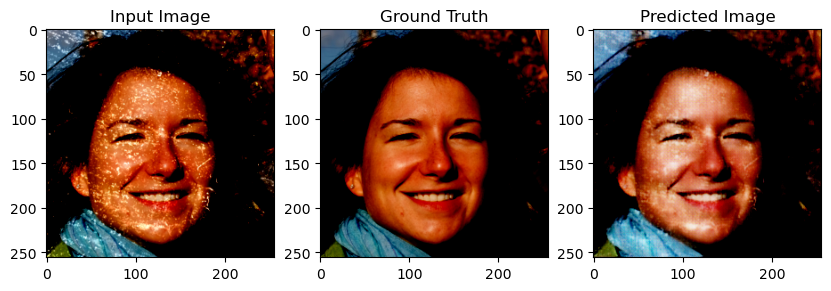

Epoch [36/40], Step [89/89], Discriminator Loss: 0.0013, Generator Loss: 0.0012, PSNR: 4.222338676452637: 100%|██████████| 89/89 [05:00<00:00,  3.37s/it]
Epoch [37/40], Step [80/89], Discriminator Loss: 0.0010, Generator Loss: 0.0011, PSNR: 4.187975883483887:  89%|████████▉ | 79/89 [04:30<00:33,  3.39s/it]

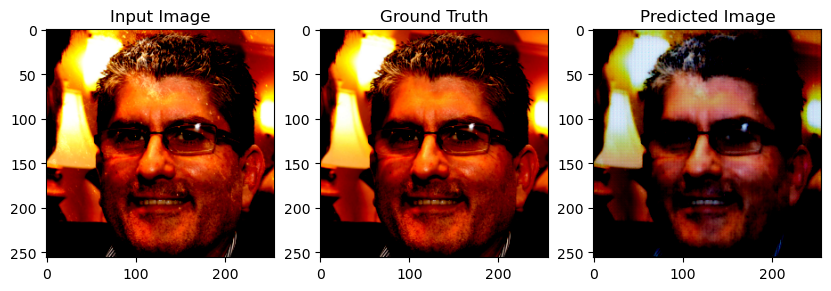

Epoch [37/40], Step [89/89], Discriminator Loss: 0.0026, Generator Loss: 0.0037, PSNR: 4.187975883483887: 100%|██████████| 89/89 [04:59<00:00,  3.37s/it]
Epoch [38/40], Step [80/89], Discriminator Loss: 0.0029, Generator Loss: 0.0010, PSNR: 1.8278485536575317:  89%|████████▉ | 79/89 [04:29<00:33,  3.35s/it]

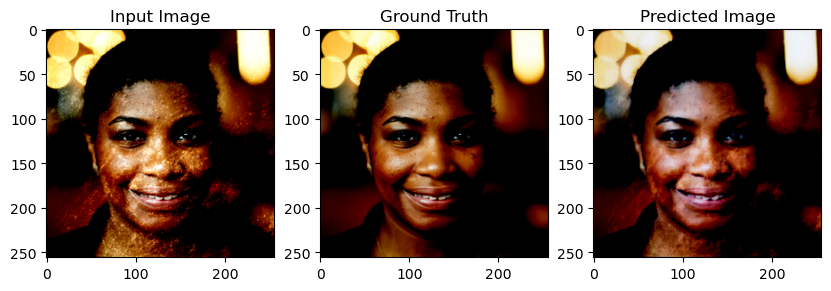

Epoch [38/40], Step [89/89], Discriminator Loss: 0.3868, Generator Loss: 0.1029, PSNR: 1.8278485536575317: 100%|██████████| 89/89 [04:58<00:00,  3.36s/it]
Epoch [39/40], Step [80/89], Discriminator Loss: 0.0049, Generator Loss: 0.0043, PSNR: 2.6698126792907715:  89%|████████▉ | 79/89 [04:30<00:33,  3.34s/it]

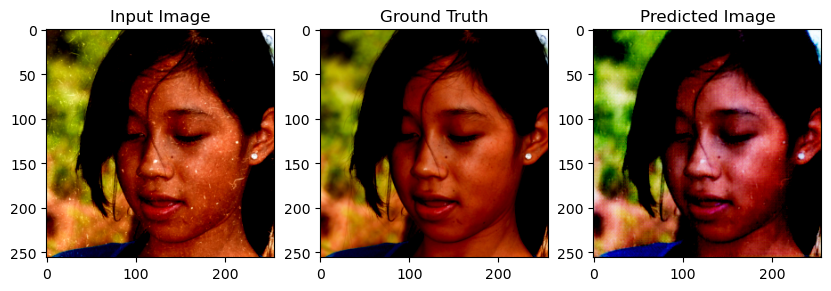

Epoch [39/40], Step [89/89], Discriminator Loss: 0.0124, Generator Loss: 0.0093, PSNR: 2.6698126792907715: 100%|██████████| 89/89 [05:00<00:00,  3.37s/it]
Epoch [40/40], Step [80/89], Discriminator Loss: 0.0025, Generator Loss: 0.0028, PSNR: 4.862209320068359:  89%|████████▉ | 79/89 [04:30<00:34,  3.45s/it]

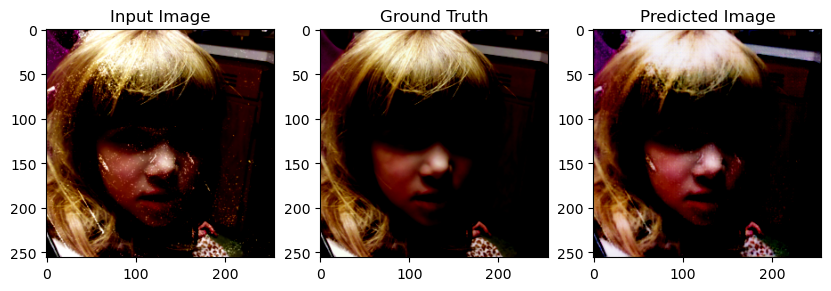

Epoch [40/40], Step [89/89], Discriminator Loss: 0.0084, Generator Loss: 0.0033, PSNR: 4.862209320068359: 100%|██████████| 89/89 [05:00<00:00,  3.37s/it]


In [ ]:
# Training setup
def train_GAN(discriminator, generator, dataloader, num_epochs=100, batch_size=64, lr=0.0002):
    #check for available GPU
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # move discriminator and generator to available device (GPU if available)
    discriminator = discriminator.to(device)
    generator = generator.to(device)

    #define loss funtions to use
    # for discriminator we will wise Binary Cross Entropy with logits
    # for discriminator we will use composite loss function
    # gen_loss = bce_loss + lambda * l1_loss
    adver_criterion = nn.BCEWithLogitsLoss()
    recon_criterion = nn.L1Loss()
    lambda_recon = 200

    #define contants to use in training loop
    display_step = 100
    lr = 0.0002

    # defining adam optimizer for both generator and disciminator
    d_optimizer = optim.Adam(discriminator.parameters(), lr=lr)
    g_optimizer = optim.Adam(generator.parameters(), lr=lr)

    d_loss_epoch = []
    g_loss_epoch = []
    psnr_epoch = []
    psnr = "--"
    for epoch in range(num_epochs):
        g_loss_batch = []
        d_loss_batch = []

        pbar = tqdm(dataloader)
        for batch_idx, (real_images,noise_images) in enumerate(pbar):
            real_images = real_images.to(device)
            noise_images = noise_images.to(device)
            batch_size = real_images.size(0)

            # Train discriminator
            d_optimizer.zero_grad()

            fake_images = generator(noise_images)
            fake_outputs = discriminator(fake_images,noise_images)

            real_outputs = discriminator(real_images,noise_images)



            real_loss = adver_criterion(real_outputs, torch.zeros_like(fake_outputs))
            fake_loss = adver_criterion(fake_outputs, torch.ones_like(real_outputs))

            d_loss = (real_loss + fake_loss)/2
            d_loss.backward()
            d_optimizer.step()

            # Train generator
            g_optimizer.zero_grad()

            fake_images = generator(noise_images)
            outputs = discriminator(fake_images,noise_images)
            g_loss = adver_criterion(outputs, torch.ones_like(outputs))

            recon_loss = recon_criterion(fake_images, real_images)
            total_loss = g_loss + lambda_recon * recon_loss

            total_loss.backward()
            g_optimizer.step()

            d_loss_batch.append(d_loss)
            g_loss_batch.append(total_loss)


            pbar.set_description('Epoch [{}/{}], Step [{}/{}], Discriminator Loss: {:.4f}, Generator Loss: {:.4f}, PSNR: {}'
                      .format(epoch+1, num_epochs, batch_idx+1, len(dataloader), d_loss.item(), g_loss.item(),psnr))
            if (batch_idx+1)%80==0:
                fake = generator(noise_images[0].unsqueeze(0)).detach()
                display_progress(noise_images[0], fake[0], real_images[0])

        with torch.no_grad():
          for real_images_val,noise_images_val in val_loader:
            real_images_val, noise_images_val = real_images_val.to(device), noise_images_val.to(device)
            test_pred = gen(noise_images)
            psnr = PSNR(real_images_val,test_pred)

        d_loss_epoch.append(torch.mean(torch.tensor(d_loss_batch)).cpu())
        g_loss_epoch.append(torch.mean(torch.tensor(g_loss_batch)).cpu())
        psnr_epoch.append(psnr.cpu())

    return g_loss_epoch, d_loss_epoch, psnr_epoch

#init generator and discriminator
gen = Generator(3,3)
dis = PatchGAN(3*2)
# Train the GAN
g_loss_epoch, d_loss_epoch, psnr_epoch = train_GAN(dis, gen, train_loader, num_epochs=40)

In [ ]:
# torch.save(gen.state_dict(), 'gen77_model.pth')
# torch.save(dis.state_dict(), 'dis77_model.pth')

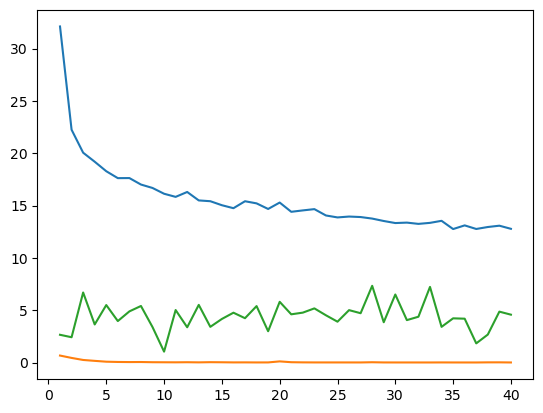

In [ ]:
epochs = [i+1 for i in range(len(g_loss_epoch))]

plt.plot(epochs,g_loss_epoch,label="Generator Loss")
plt.plot(epochs,d_loss_epoch,label="Discriminator Loss")
plt.plot(epochs,psnr_epoch,label="Mean PSNR")

In [ ]:
# torch.save(gen.state_dict(), 'gen77_model.pth')
# torch.save(dis.state_dict(), 'dis77_model.pth')